<a href="https://colab.research.google.com/github/jasonhops/IE7374/blob/main/IE7374_Project_Model_Training_and_Testing.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#AI Refridgerator Project by Group 12
##Milestone 3: Model Pipeline Implementation

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import gdown
file_id = "13BJXv4_D-7eOGBLKZFjmNL0A-yFPKiHQ"
gdown.download(f"https://drive.google.com/uc?id={file_id}", output="RecipeNLG_dataset.csv", quiet=False)

Downloading...
From (original): https://drive.google.com/uc?id=13BJXv4_D-7eOGBLKZFjmNL0A-yFPKiHQ
From (redirected): https://drive.google.com/uc?id=13BJXv4_D-7eOGBLKZFjmNL0A-yFPKiHQ&confirm=t&uuid=7e21fa38-6a12-4177-8999-623e3a9d8f35
To: /content/RecipeNLG_dataset.csv
100%|██████████| 2.29G/2.29G [00:27<00:00, 84.8MB/s]


'RecipeNLG_dataset.csv'

In [3]:
import pandas as pd

df = pd.read_csv("RecipeNLG_dataset.csv")
df.head()

,Unnamed: 0,title,ingredients,directions,link,source,NER
0,0,No-Bake Nut Cookies,"[""1 c. firmly packed brown sugar"", ""1/2 c. eva...","[""In a heavy 2-quart saucepan, mix brown sugar...",www.cookbooks.com/Recipe-Details.aspx?id=44874,Gathered,"[""brown sugar"", ""milk"", ""vanilla"", ""nuts"", ""bu..."
1,1,Jewell Ball'S Chicken,"[""1 small jar chipped beef, cut up"", ""4 boned ...","[""Place chipped beef on bottom of baking dish....",www.cookbooks.com/Recipe-Details.aspx?id=699419,Gathered,"[""beef"", ""chicken breasts"", ""cream of mushroom..."
2,2,Creamy Corn,"[""2 (16 oz.) pkg. frozen corn"", ""1 (8 oz.) pkg...","[""In a slow cooker, combine all ingredients. C...",www.cookbooks.com/Recipe-Details.aspx?id=10570,Gathered,"[""frozen corn"", ""cream cheese"", ""butter"", ""gar..."
3,3,Chicken Funny,"[""1 large whole chicken"", ""2 (10 1/2 oz.) cans...","[""Boil and debone chicken."", ""Put bite size pi...",www.cookbooks.com/Recipe-Details.aspx?id=897570,Gathered,"[""chicken"", ""chicken gravy"", ""cream of mushroo..."
4,4,Reeses Cups(Candy),"[""1 c. peanut butter"", ""3/4 c. graham cracker ...","[""Combine first four ingredients and press in ...",www.cookbooks.com/Recipe-Details.aspx?id=659239,Gathered,"[""peanut butter"", ""graham cracker crumbs"", ""bu..."


In [4]:
import json

df["ingredients"] = df["ingredients"].apply(json.loads)
df["directions"] = df["directions"].apply(json.loads)

In [5]:
# Define common fridge items
dairy_items = {
    "milk", "cheese", "butter", "yogurt", "cream", "ghee", "curd", "kefir", "paneer", "ricotta",
    "parmesan", "mozzarella", "custard", "evaporatedmilk", "condensedmilk", "sourcream"
}
protein_items = {
    "egg", "bacon", "ham", "chicken", "turkey", "beef", "pork", "salmon", "tuna", "shrimp",
    "lamb", "duck", "steak", "sausage", "anchovy", "crab", "lobster", "mutton", "tilapia", "venison"
}
vegetable_items = {
    "lettuce", "spinach", "kale", "cabbage", "carrot", "onion", "garlic", "tomato", "pepper",
    "zucchini", "cucumber", "broccoli", "cauliflower", "celery", "radish", "turnip", "beet",
    "asparagus", "eggplant", "leek", "okra", "arugula", "parsley", "cilantro", "basil",
    "dill", "chard", "shallot", "scallion", "endive"
}
fungi_items = {
    "mushroom", "shiitake", "portobello", "enoki", "oyster", "cremini"
}
fruit_items = {
    "apple", "grape", "orange", "lemon", "lime", "pear", "peach", "banana", "mango", "blueberry",
    "strawberry", "raspberry", "blackberry", "plum", "apricot", "fig", "date", "melon", "kiwi", "pineapple"
}
grain_items = {
    "rice", "pasta", "noodle", "bread", "quinoa", "couscous", "oats", "barley", "flour", "tortilla",
    "corn", "bun", "bagel", "roll", "biscuit", "cracker", "crouton"
}
condiment_items = {
    "ketchup", "mustard", "mayonnaise", "relish", "vinegar", "sriracha", "pesto", "soy", "tamari",
    "miso", "salsa", "hummus", "tahini", "chutney", "aioli", "dressing", "gravy"
}
spice_items = {
    "salt", "pepper", "cumin", "turmeric", "paprika", "cinnamon", "nutmeg", "oregano",
    "thyme", "rosemary", "chili", "cardamom", "clove", "coriander", "sage"
}
nut_items = {
    "almond", "cashew", "walnut", "pecan", "hazelnut", "peanut", "pistachio", "chia", "flax", "sesame", "hemp"
}
beverage_items = {
    "juice", "soda", "cola", "water", "tea", "coffee", "kombucha", "smoothie", "lemonade"
}

fridge_items = (
    dairy_items |
    protein_items |
    vegetable_items |
    fungi_items |
    fruit_items |
    grain_items |
    condiment_items |
    spice_items |
    nut_items |
    beverage_items
)

#temporary shortlist for Milestone 3: Model Pipeline Implementation
fridge_items = {
    "milk", "cheese", "cream cheese", "butter", "yogurt", "sour cream", "egg",
    "tomato", "onion", "lettuce", "spinach", "cabbage", "zucchini", "carrot",
    "garlic", "cucumber", "pepper", "celery", "apple", "grapes", "corn", "mushroom"
}

# Fridge inventory filter
def has_fridge_item(ingredients):
    match_count = sum(item.lower() in fridge_items for item in ingredients)
    return 2 <= len(ingredients) <= 10 and match_count >= 1

# Apply filter
df_subset = df[df["ingredients"].apply(has_fridge_item)]

# Sample 20% for train set
df_train = df_subset.sample(frac=0.8, random_state=42)

# Use drop to remove train rows from full set
df_test = df_subset.drop(df_train.index)

In [6]:
# Convert ingredients and directions back to string
df_train["text"] = df_train.apply(
    lambda x: f"{', '.join(x['ingredients'])} -> {x['title'].strip()}. Instructions: {' '.join(x['directions']).strip()}",
    axis=1
)
df_train = df_train.dropna(subset=["text"])

In [7]:
df_train["text"].to_csv("filtered_recipes_gpt.txt", index=False, header=False)

In [8]:
with open("filtered_recipes_gpt.txt", "r", encoding="utf-8") as f:
    contents = f.read()
    print(contents)
with open("filtered_recipes_gpt.txt", "r", encoding="utf-8") as file:
    lines = file.readlines()
    print("Number of rows:", len(lines))

"4 boneless pork chops, 2 to 3 Idaho potatoes, 1 large yellow onion, 1 green pepper, milk, salt and pepper -> Pork Chops And Scalloped Potatoes. Instructions: Peel and slice thinly the potatoes and place in a casserole dish. Thinly slice onion and pepper and mix with the potato slices. Add salt and freshly ground pepper to taste. Trim excess fat off the chops and lay chops on top of the vegetables. Add milk to top of potatoes. Cover and bake at 350° for 1 hour. Serves 4."
"1 medium-size eggplant, 1 can cream of mushroom soup, butter, milk or cream (I use the soup can of milk), crackers -> Eggplant Casserole. Instructions: Peel and cut eggplant into cubes. Cook in salt water until tender. Line a baking dish with crackers. Put alternate layers of crackers and eggplant. Cover with cream of mushroom soup into which milk or cream is added. Roll cracker crumbs and sprinkle on top. Dot with butter and sprinkle with paprika. Bake until brown."
"1 lb. hamburger, salt, pepper, chopped onions, su

In [9]:
import torch
from transformers import GPT2LMHeadModel, GPT2Tokenizer
from datasets import load_dataset
from torch.utils.data import DataLoader
from tqdm import tqdm

In [10]:
model_name = "gpt2"
tokenizer = GPT2Tokenizer.from_pretrained(model_name)
tokenizer.pad_token = tokenizer.eos_token
model = GPT2LMHeadModel.from_pretrained(model_name)
model.resize_token_embeddings(len(tokenizer))

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/26.0 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/1.04M [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/456k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/1.36M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/665 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/548M [00:00<?, ?B/s]

generation_config.json:   0%|          | 0.00/124 [00:00<?, ?B/s]

GPT2LMHeadModel(
  (transformer): GPT2Model(
    (wte): Embedding(50257, 768)
    (wpe): Embedding(1024, 768)
    (drop): Dropout(p=0.1, inplace=False)
    (h): ModuleList(
      (0-11): 12 x GPT2Block(
        (ln_1): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
        (attn): GPT2Attention(
          (c_attn): Conv1D(nf=2304, nx=768)
          (c_proj): Conv1D(nf=768, nx=768)
          (attn_dropout): Dropout(p=0.1, inplace=False)
          (resid_dropout): Dropout(p=0.1, inplace=False)
        )
        (ln_2): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
        (mlp): GPT2MLP(
          (c_fc): Conv1D(nf=3072, nx=768)
          (c_proj): Conv1D(nf=768, nx=3072)
          (act): NewGELUActivation()
          (dropout): Dropout(p=0.1, inplace=False)
        )
      )
    )
    (ln_f): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
  )
  (lm_head): Linear(in_features=768, out_features=50257, bias=False)
)

In [11]:
from transformers import GPT2Tokenizer
import torch
from torch.utils.data import Dataset, DataLoader

# Load tokenizer
tokenizer = GPT2Tokenizer.from_pretrained("gpt2")
tokenizer.pad_token = tokenizer.eos_token

model = GPT2LMHeadModel.from_pretrained("gpt2")
model.resize_token_embeddings(len(tokenizer))

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

# Load training data
with open("filtered_recipes_gpt.txt", "r") as f:
    lines = [line.strip() for line in f if line.strip()]

class RecipeDataset(Dataset):
    def __init__(self, texts, tokenizer, max_length=128):
        self.examples = tokenizer(
            texts,
            truncation=True,
            padding="max_length",
            max_length=max_length,
            return_tensors="pt"
        )

    def __len__(self):
        return self.examples["input_ids"].shape[0]

    def __getitem__(self, idx):
        return {
            "input_ids": self.examples["input_ids"][idx],
            "attention_mask": self.examples["attention_mask"][idx],
        }

dataset = RecipeDataset(lines, tokenizer)
loader = DataLoader(dataset, batch_size=2, shuffle=True)

In [12]:
import matplotlib.pyplot as plt
from transformers import GPT2LMHeadModel
model = GPT2LMHeadModel.from_pretrained("gpt2")
model.resize_token_embeddings(len(tokenizer))
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

optimizer = torch.optim.AdamW(model.parameters(), lr=5e-5)
model.train()

epochs = 15
epoch_losses = []
for epoch in range(epochs):
    total_loss = 0
    for batch in tqdm(loader):
        inputs = batch["input_ids"].to(device)
        attention_mask = batch["attention_mask"].to(device)

        outputs = model(input_ids=inputs, attention_mask=attention_mask, labels=inputs)
        loss = outputs.loss
        loss.backward()
        optimizer.step()
        optimizer.zero_grad()
        total_loss += loss.item()

    avg_loss = total_loss / len(loader)
    epoch_losses.append(avg_loss)
    print(f"Epoch {epoch+1} - Loss: {total_loss / len(loader)}")


100%|██████████| 11034/11034 [14:05<00:00, 13.05it/s]


Epoch 1 - Loss: 2.033879717385529


100%|██████████| 11034/11034 [14:05<00:00, 13.06it/s]


Epoch 2 - Loss: 1.7984523390765335


100%|██████████| 11034/11034 [14:05<00:00, 13.05it/s]


Epoch 3 - Loss: 1.6810261792563563


100%|██████████| 11034/11034 [14:05<00:00, 13.04it/s]


Epoch 4 - Loss: 1.590261259139697


100%|██████████| 11034/11034 [14:05<00:00, 13.05it/s]


Epoch 5 - Loss: 1.5121768346261952


100%|██████████| 11034/11034 [14:05<00:00, 13.05it/s]


Epoch 6 - Loss: 1.4408746626533977


100%|██████████| 11034/11034 [14:05<00:00, 13.04it/s]


Epoch 7 - Loss: 1.3747267816131348


100%|██████████| 11034/11034 [14:06<00:00, 13.04it/s]


Epoch 8 - Loss: 1.312175049075986


100%|██████████| 11034/11034 [14:07<00:00, 13.02it/s]


Epoch 9 - Loss: 1.25225911304984


100%|██████████| 11034/11034 [14:06<00:00, 13.03it/s]


Epoch 10 - Loss: 1.1947365456681245


100%|██████████| 11034/11034 [14:08<00:00, 13.00it/s]


Epoch 11 - Loss: 1.1390226808863964


100%|██████████| 11034/11034 [14:05<00:00, 13.05it/s]


Epoch 12 - Loss: 1.086081998167164


100%|██████████| 11034/11034 [14:06<00:00, 13.04it/s]


Epoch 13 - Loss: 1.0340099622327845


100%|██████████| 11034/11034 [14:07<00:00, 13.01it/s]


Epoch 14 - Loss: 0.9853866138651316


100%|██████████| 11034/11034 [14:07<00:00, 13.03it/s]

Epoch 15 - Loss: 0.9375877956612799


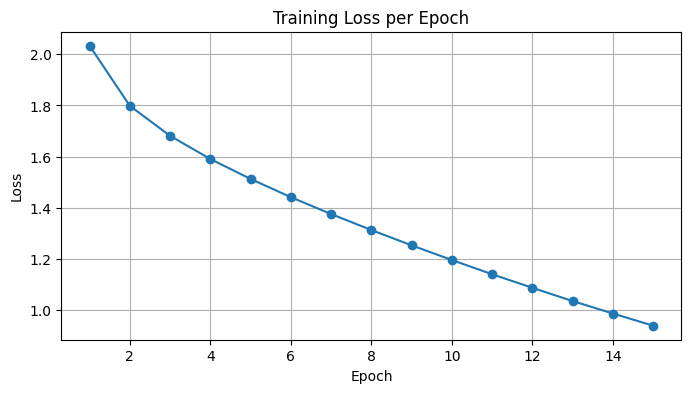

In [13]:
plt.figure(figsize=(8, 4))
plt.plot(range(1, len(epoch_losses) + 1), epoch_losses, marker='o')
plt.title("Training Loss per Epoch")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.grid(True)
plt.show()

In [14]:
model.save_pretrained("gpt2-recipes-manual")
tokenizer.save_pretrained("gpt2-recipes-manual")
print("Model saved to 'gpt2-recipes-manual'")

Model saved to 'gpt2-recipes-manual'


In [15]:
!ls -lh gpt2-recipes-manual

total 477M
-rw-r--r-- 1 root root  880 Jul 27 00:02 config.json
-rw-r--r-- 1 root root  119 Jul 27 00:02 generation_config.json
-rw-r--r-- 1 root root 446K Jul 27 00:02 merges.txt
-rw-r--r-- 1 root root 475M Jul 27 00:02 model.safetensors
-rw-r--r-- 1 root root  470 Jul 27 00:02 special_tokens_map.json
-rw-r--r-- 1 root root  556 Jul 27 00:02 tokenizer_config.json
-rw-r--r-- 1 root root 976K Jul 27 00:02 vocab.json


In [16]:
import shutil

shutil.make_archive("gpt2-recipes-manual", 'zip', "gpt2-recipes-manual")

'/content/gpt2-recipes-manual.zip'

In [17]:
from google.colab import files
files.download('gpt2-recipes-manual.zip')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

**Model Testing**

In [18]:
# Testing
def test_model(prompt, max_length=100):
    model.eval()
    inputs = tokenizer(prompt, return_tensors="pt").to(device)

    # Generate output
    output = model.generate(
        **inputs,
        max_length=120,
        do_sample=True,
        top_k=50,
        top_p=0.92,
        temperature=0.65,
        repetition_penalty=1.3,
        pad_token_id=tokenizer.eos_token_id,
        eos_token_id=tokenizer.eos_token_id
    )

    generated_text = tokenizer.decode(output[0], skip_special_tokens=True)
    print("Prompt:", prompt)
    print(generated_text[len(prompt):].strip())

In [19]:
prompt = (
    "Ingredients: egg, flour, sugar\n"
    "Recipe Title: "
)

test_model(prompt)

Prompt: Ingredients: egg, flour, sugar
Recipe Title: 
18 oz bag frzn hash browns. 8oz shredded cheddar cheese, 1/2 cup evaporated milk, butter -> Hash Brown Potato Frittata Breakfast Casserole Or Onion Quiche Recipe. Instructions: Preheat oven to 425 degrees. Spray a 9x13 baking dish with non stick spray and line the bottom of pan w/ some kind of foil so that it covers the potatoes when they are done (i don't suggest adding in extra virgin olive oil as this willrimp down). Whisk together egg & sugar until


In [41]:
prompt = (
    "Ingredients: egg, flour, sugar\n"
    "Recipe Title: "
)

test_model(prompt)

Prompt: Ingredients: egg, flour, sugar
Recipe Title: 
pumpkin pieillards, mixed according to pack instructions. Shape into balls and bake for 10 mins at 450 degrees. Remove from oven when done. Cool. Roll out dough on a floured surface until it is again very thin and puffy. Roll this up into little balls, then flatten with a spatula and drop in the saucepan of your choice (Pecorino romano or Roma) for about 5 minutes. Let cool.  Meanwhile make Pumpkin Spice Mix according1 package directions


In [20]:
prompt = "cheese, tomato, lettuce →"
test_model(prompt)

Prompt: cheese, tomato, lettuce →
-> Cheese And Lettuce Sandwich. Instructions: First you buy our nice plate and some fries (Drees) and then ween with a little bit of mayonnaise."


In [43]:
prompt = "Ingredients: egg, flour, sugar → Recipe:"
test_model(prompt)

Prompt: Ingredients: egg, flour, sugar → Recipe:
Cookies, Spiceings -> Perfect Pancakes. Instructions: Add in a mixing bowl, just enough batter to be able to coat the pan with oil and butter. Stir in some brown sugar at one end of each pancake. Turn on oven broiler. When done, pour mixture into baking dish and bake about 8 min at 350 degrees."


In [22]:
prompt = "cheese, tomato, lettuce -> "
test_model(prompt)

Prompt: cheese, tomato, lettuce -> 
Tacos. Instructions: First you toast the plate and then you put the sauce on, then you put the cheese on, then you put the tomatoes and lettuce on, then you throw it in your mouth and eat it."


In [23]:
# "pepper", "celery", "apple", "grapes", "corn"
prompt = "pepper, celery, apple, grapes, corn -> "
test_model(prompt)

Prompt: pepper, celery, apple, grapes, corn -> 
Grape Salad. Instructions: Chop vegetables very fine. Add lemon juice, sugar and salt to taste."


In [44]:
test_model("Ingredients: egg, milk, cheese → Recipe:")
test_model("Ingredients: butter, garlic, mushroom → Recipe:")
test_model("Ingredients: tomato, onion, lettuce → Recipe:")
test_model("Ingredients: zucchini, carrot, sour cream → Recipe:")
test_model("Ingredients: apple, grapes, yogurt → Recipe:")
test_model("Ingredients: cabbage, pepper, celery → Recipe:")
test_model("Ingredients: egg, flour, sugar → Recipe:")
test_model("Ingredients: cheese, tomato, lettuce → Recipe:")
test_model("Ingredients: butter, garlic, mushroom → Recipe:")
test_model("Ingredients: tomato, onion, lettuce → Recipe:")

Prompt: Ingredients: egg, milk, cheese → Recipe:
Cake batter -> Cookies And Creams. Instructions: How to make a cake pan for your new baby daughter? Cut the ends off an onion and use it as carrot sticks - not too thin either! Use enough eggs so that they are still attached between sheets of plastic wrap when dipping dinner roll In one layer put layers Of diced carrots and shredded cabbage mixed together then pour some melted butter over them all including in sugar/butter!. Make two seperate bowls with each sheet containing filling be rounded tablespoons or margarine. Now prepare these biscuits using flour,
Prompt: Ingredients: butter, garlic, mushroom → Recipe:
make your own sauce with thisrecipe"
Prompt: Ingredients: tomato, onion, lettuce → Recipe:
http://yummly.com/2015/1020/sustainable-entertaining-onion-stick Cooking Spray."
Prompt: Ingredients: zucchini, carrot, sour cream → Recipe:
Zucchine Kugel, Parmesan, parsley, salt and pepper, egg -> Veggie Scramble. Instructions: 1- slice

In [25]:
from torch.nn import CrossEntropyLoss
import math
import torch

def calculate_perplexity(model, tokenizer, text):
    model.eval()

    # Tokenize input
    inputs = tokenizer(text, return_tensors="pt", padding=True, truncation=True).to(model.device)

    with torch.no_grad():
        outputs = model(**inputs, labels=inputs["input_ids"])
        loss = outputs.loss

    return math.exp(loss.item())

prompt = "Ingredients: egg, flour, sugar → Recipe:"

inputs = tokenizer(prompt, return_tensors="pt").to(model.device)
output = model.generate(
    **inputs,
    max_length=100,
    do_sample=False,
    pad_token_id=tokenizer.eos_token_id
)

generated_text = tokenizer.decode(output[0], skip_special_tokens=True)
print("Prompt:", prompt)
print(generated_text[len(prompt):].strip())

full_text = prompt + " " + generated_text[len(prompt):].strip()
perplexity = calculate_perplexity(model, tokenizer, full_text)
print(f"Perplexity: {perplexity:.2f}")

Prompt: Ingredients: egg, flour, sugar → Recipe:

Perplexity: 1205.66


In [26]:
from torch.nn import CrossEntropyLoss
import math
from nltk.translate.bleu_score import sentence_bleu, SmoothingFunction

model.eval()

prompt = "Ingredients: egg, flour, sugar → Recipe:"
reference = "Pancake. Instructions: Mix egg, flour, and sugar. Fry until golden."

inputs = tokenizer(prompt, return_tensors="pt").to(device)
output = model.generate(
    **inputs,
    max_length=100,
    do_sample=False,
    pad_token_id=tokenizer.eos_token_id
)
generated = tokenizer.decode(output[0], skip_special_tokens=True)
generated_cont = generated[len(prompt):].strip()

# BLEU score
smoothie = SmoothingFunction().method4
bleu = sentence_bleu([reference.split()], generated_cont.split(), smoothing_function=smoothie)

# Perplexity
def calculate_perplexity(text):
    inputs = tokenizer(text, return_tensors="pt", truncation=True).to(model.device)
    with torch.no_grad():
        outputs = model(**inputs, labels=inputs["input_ids"])
        return math.exp(outputs.loss.item())

ppl = calculate_perplexity(prompt + " " + generated_cont)

print("Prompt:", prompt)
print(generated_cont)
print(f"BLEU: {bleu:.3f}")
print(f"Perplexity: {ppl:.2f}")

Prompt: Ingredients: egg, flour, sugar → Recipe:

BLEU: 0.000
Perplexity: 1205.66
